---
format:
  html:
   code-fold: true
   code-summary: "Show the code"
   toc: true
   page-layout: full
jupyter: Python3

---

# Part I - Arts & Culture in New York & London


The first part of this project aims to provide a city-level overview of art and cultural infrastructure in two of the largest cities in the world – New York City and London. Besides thriving arts and cultural scene in the two cities, another reason for choosing them is their effort in creating programs that support local artists and dedicate urban space for producing, performing, and displaying creative work. From basic spatial distribution to equity in access to arts and cultural infrastructure, this section aims to highlight cultural hubs and show the potential discriminations lower income communities are facing. Art has historically been a bougie and privileged field, but it doesn’t have to be anymore. 

All data in this section is acquired through NYC and London’s city data portal. 


In [1]:
import pandas as pd
import numpy as np
import altair as alt
import geopandas as gpd
import hvplot.pandas
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import datetime
import math

%matplotlib inline

import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objects as go
from plotly.subplots import make_subplots



# Key Findings

Both in NYC and London, we are seeing a disproportionally higher density and more variety of art and cultural infrastructure in city centers. However, interestingly, there isn’t a clear positive linear relationship between household income and number of art and cultural amenities – it seems like lower income communities also have access to a decent number of infrastructures, through incomparable to the diversity present in city centers. The most famous and largest museums, including but not limited to the Metropolitan Museum of Art, Modern Museum of Art, and the British Museum, are all located in more of the central area. 

<Markdown>

# Data & Sources

<li><strong>NYC Open Data</strong>: Art galleries, museums, libraries, theaters
<li><strong>Census Data</strong>: 2020 Population & Median Household Income, neighborhood geometry
<li><strong>Greater London Authority</strong>: Creative Enterprise Zones, multiple cultural infrastructure, London average earnings 2022 by Boroughs

In [2]:
# NYC

# Neighborhoods Geo
NYC_Neighborhood = pd.read_csv("./Final_Data/1/2020 Neighborhood.csv")
NYC_Neighborhood['geometry'] = gpd.GeoSeries.from_wkt(NYC_Neighborhood['the_geom'])
NYC_Neighborhood = gpd.GeoDataFrame(NYC_Neighborhood, geometry='geometry').set_crs(epsg=4326)

# Cultural Amenities Load Data
NYC_art_galleries = gpd.read_file("./Final_Data/1/art galleries.geojson").set_crs(epsg=4326)
NYC_museums = gpd.read_file("./Final_Data/1/museums.geojson").set_crs(epsg=4326)
NYC_library = gpd.read_file("./Final_Data/1/libraries.geojson").set_crs(epsg=4326)
NYC_theaters = gpd.read_file("./Final_Data/1/Theaters.geojson").set_crs(epsg=4326)

NYC_art_galleries = NYC_art_galleries[['name','zip','address1','geometry']]
NYC_art_galleries.rename(
    columns={"address1": "Address", "name": "Name", "zip": "Zip"},
    inplace=True,)

NYC_museums = NYC_museums[['name','zip','adress1','geometry']]
NYC_museums.rename(
    columns={"adress1": "Address", "name": "Name", "zip": "Zip"},
    inplace=True,)

NYC_library = NYC_library[['name','zip','streetname','geometry']]
NYC_library.rename(
    columns={"streetname": "Address", "name": "Name", "zip": "Zip"},
    inplace=True,)

NYC_theaters = NYC_theaters[['name','zip','address1','geometry']]
NYC_theaters.rename(
    columns={"address1": "Address", "name": "Name", "zip": "Zip"},
    inplace=True,)


# Aggregate all 
NYC_art_galleries.loc[:,"Type"]= "Art Gallery"
NYC_museums.loc[:,"Type"]= "Museums"
NYC_library.loc[:,"Type"]= "Libraries"
NYC_theaters.loc[:,"Type"]= "Theatre"

# Cultural Amenities
NYC_amenities = pd.concat([NYC_art_galleries, NYC_museums, NYC_library, NYC_theaters])

In [3]:

# Census Tract
NYC_Tracts = pd.read_csv("./Final_Data/1/2022 Census Tracts.csv")
NYC_Tracts['geometry'] = gpd.GeoSeries.from_wkt(NYC_Tracts['the_geom'])
NYC_Tracts = gpd.GeoDataFrame(NYC_Tracts, geometry='geometry').set_crs(epsg=4326)

In [4]:


# NYC Population

NYC_pop = gpd.read_file("./Final_Data/1/NYC_population.geojson")


NYC_pop = NYC_pop[['GEOID', 'estimate']]
NYC_pop['GEOID']=NYC_pop['GEOID'].astype(int)

NYC_pop = NYC_Tracts.merge(NYC_pop, on='GEOID', how='left') 
NYC_NTA_pop = NYC_pop.groupby(['NTAName']).sum(['estimate']).reset_index()

In [5]:
#London 
London_Boro = gpd.read_file('./Final_Data/1/London_Boroughs.gpkg').set_crs(epsg=27700)

#London Creative Enterprize Zone
London_CEZ = gpd.read_file('./Final_Data/1/London CEZ.gpkg').set_crs(epsg=27700)

# Cultural Amenities
London_Cultural_Venues = gpd.read_file('./Final_Data/1/London_Cultural/cultural_venues_in_GIS_format.gpkg').to_crs(epsg=4326)
London_Cultural_Venues = London_Cultural_Venues[['name','borough_name','address1','geometry']]
London_Cultural_Venues.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)


London_Art_Centers = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Arts centres.csv')
London_Art_Centers = gpd.GeoDataFrame(London_Art_Centers, geometry=gpd.points_from_xy(x=London_Art_Centers.longitude, y=London_Art_Centers.latitude)).set_crs(epsg=4326)
London_Art_Centers = London_Art_Centers[['name','borough_name','address1','geometry']]
London_Art_Centers.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Artist_Workspaces = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Artists workspaces.csv')
London_Artist_Workspaces = gpd.GeoDataFrame(London_Artist_Workspaces, geometry=gpd.points_from_xy(x=London_Artist_Workspaces.longitude, y=London_Artist_Workspaces.latitude)).set_crs(epsg=4326)
London_Artist_Workspaces = London_Artist_Workspaces[['name','borough_name','address1','geometry']]
London_Artist_Workspaces.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Cinemas = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Cinemas.csv')
London_Cinemas = gpd.GeoDataFrame(London_Cinemas, geometry=gpd.points_from_xy(x=London_Cinemas.longitude, y=London_Cinemas.latitude)).set_crs(epsg=4326)
London_Cinemas = London_Cinemas[['name','borough_name','address1','geometry']]
London_Cinemas.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Commercial_Galleries = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Commercial galleries.csv')
London_Commercial_Galleries = gpd.GeoDataFrame(London_Commercial_Galleries, geometry=gpd.points_from_xy(x=London_Commercial_Galleries.longitude, y=London_Commercial_Galleries.latitude)).set_crs(epsg=4326)
London_Commercial_Galleries = London_Commercial_Galleries[['name','borough_name','address1','geometry']]
London_Commercial_Galleries.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Creative_Coworking = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Creative coworking desk space.csv')
London_Creative_Coworking = gpd.GeoDataFrame(London_Creative_Coworking, geometry=gpd.points_from_xy(x=London_Creative_Coworking.longitude, y=London_Creative_Coworking.latitude)).set_crs(epsg=4326)
London_Creative_Coworking = London_Creative_Coworking[['name','borough_name','address1','geometry']]
London_Creative_Coworking.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Dance_Performance = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Dance performance venues.csv')
London_Dance_Performance = gpd.GeoDataFrame(London_Dance_Performance, geometry=gpd.points_from_xy(x=London_Dance_Performance.longitude, y=London_Dance_Performance.latitude)).set_crs(epsg=4326)
London_Dance_Performance = London_Dance_Performance[['name','borough_name','address1','geometry']]
London_Dance_Performance.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Dance_Rehearsal = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Dance rehearsal studios.csv')
London_Dance_Rehearsal = gpd.GeoDataFrame(London_Dance_Rehearsal, geometry=gpd.points_from_xy(x=London_Dance_Rehearsal.longitude, y=London_Dance_Rehearsal.latitude)).set_crs(epsg=4326)
London_Dance_Rehearsal = London_Dance_Rehearsal[['name','borough_name','address1','geometry']]
London_Dance_Rehearsal.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Fashion_Design = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Fashion and design.csv')
London_Fashion_Design = gpd.GeoDataFrame(London_Fashion_Design, geometry=gpd.points_from_xy(x=London_Fashion_Design.longitude, y=London_Fashion_Design.latitude)).set_crs(epsg=4326)
London_Fashion_Design = London_Fashion_Design[['name','borough_name','address1','geometry']]
London_Fashion_Design.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Jewllery = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Jewellery design.csv')
London_Jewllery = gpd.GeoDataFrame(London_Jewllery, geometry=gpd.points_from_xy(x=London_Jewllery.longitude, y=London_Jewllery.latitude)).set_crs(epsg=4326)
London_Jewllery = London_Jewllery[['name','borough_name','address1','geometry']]
London_Jewllery.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_LGBT = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Lgbt venues.csv')
London_LGBT = gpd.GeoDataFrame(London_LGBT, geometry=gpd.points_from_xy(x=London_LGBT.longitude, y=London_LGBT.latitude)).set_crs(epsg=4326)
London_LGBT = London_LGBT[['name','borough_name','address1','geometry']]
London_LGBT.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_libraries = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Libraries.csv')
London_libraries = gpd.GeoDataFrame(London_libraries, geometry=gpd.points_from_xy(x=London_libraries.longitude, y=London_libraries.latitude)).set_crs(epsg=4326)
London_libraries = London_libraries[['name','borough_name','address1','geometry']]
London_libraries.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)


London_Makerspaces = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Makerspaces.csv')
London_Makerspaces = gpd.GeoDataFrame(London_Makerspaces, geometry=gpd.points_from_xy(x=London_Makerspaces.longitude, y=London_Makerspaces.latitude)).set_crs(epsg=4326)
London_Makerspaces = London_Makerspaces[['name','borough_name','address1','geometry']]
London_Makerspaces.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Make_Manufacture = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Making and manufacturing.csv')
London_Make_Manufacture = gpd.GeoDataFrame(London_Make_Manufacture, geometry=gpd.points_from_xy(x=London_Make_Manufacture.longitude, y=London_Make_Manufacture.latitude)).set_crs(epsg=4326)
London_Make_Manufacture = London_Make_Manufacture[['name','borough_name','address1','geometry']]
London_Make_Manufacture.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Museums = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Museums and public galleries.csv')
London_Museums = gpd.GeoDataFrame(London_Museums, geometry=gpd.points_from_xy(x=London_Museums.longitude, y=London_Museums.latitude)).set_crs(epsg=4326)
London_Museums = London_Museums[['name','borough_name','address1','geometry']]
London_Museums.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Music_All = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Music all.csv')
London_Music_All = gpd.GeoDataFrame(London_Music_All, geometry=gpd.points_from_xy(x=London_Music_All.longitude, y=London_Music_All.latitude)).set_crs(epsg=4326)
London_Music_All = London_Music_All[['name','borough_name','address1','geometry']]
London_Music_All.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Music_Record = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Music recording studios.csv')
London_Music_Record = gpd.GeoDataFrame(London_Music_Record, geometry=gpd.points_from_xy(x=London_Music_Record.longitude, y=London_Music_Record.latitude)).set_crs(epsg=4326)
London_Music_Record = London_Music_Record[['name','borough_name','address1','geometry']]
London_Music_Record.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Music_Rehearsal = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Music rehearsal studios.csv')
London_Music_Rehearsal = gpd.GeoDataFrame(London_Music_Rehearsal, geometry=gpd.points_from_xy(x=London_Music_Rehearsal.longitude, y=London_Music_Rehearsal.latitude)).set_crs(epsg=4326)
London_Music_Rehearsal = London_Music_Rehearsal[['name','borough_name','address1','geometry']]
London_Music_Rehearsal.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Prop_Costume = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Prop and costume making.csv')
London_Prop_Costume = gpd.GeoDataFrame(London_Prop_Costume, geometry=gpd.points_from_xy(x=London_Prop_Costume.longitude, y=London_Prop_Costume.latitude)).set_crs(epsg=4326)
London_Prop_Costume = London_Prop_Costume[['name','borough_name','address1','geometry']]
London_Prop_Costume.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Set_Exhibition = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Set and exhibition building.csv')
London_Set_Exhibition = gpd.GeoDataFrame(London_Set_Exhibition, geometry=gpd.points_from_xy(x=London_Set_Exhibition.longitude, y=London_Set_Exhibition.latitude)).set_crs(epsg=4326)
London_Set_Exhibition = London_Set_Exhibition[['name','borough_name','address1','geometry']]
London_Set_Exhibition.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Textile_Design = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Textile design.csv')
London_Textile_Design = gpd.GeoDataFrame(London_Textile_Design, geometry=gpd.points_from_xy(x=London_Textile_Design.longitude, y=London_Textile_Design.latitude)).set_crs(epsg=4326)
London_Textile_Design = London_Textile_Design[['name','borough_name','address1','geometry']]
London_Textile_Design.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Theatre_Rehearsal = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Theatre rehearsal studios.csv')
London_Theatre_Rehearsal = gpd.GeoDataFrame(London_Theatre_Rehearsal, geometry=gpd.points_from_xy(x=London_Theatre_Rehearsal.longitude, y=London_Theatre_Rehearsal.latitude)).set_crs(epsg=4326)
London_Theatre_Rehearsal = London_Theatre_Rehearsal[['name','borough_name','address1','geometry']]
London_Theatre_Rehearsal.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)

London_Theatre = pd.read_csv('./Final_Data/1/London_Cultural/CIM 2023 Theatre.csv')
London_Theatre = gpd.GeoDataFrame(London_Theatre, geometry=gpd.points_from_xy(x=London_Theatre.longitude, y=London_Theatre.latitude)).set_crs(epsg=4326)
London_Theatre = London_Theatre[['name','borough_name','address1','geometry']]
London_Theatre.rename(columns={"address1": "Address", "name": "Name", "borough_name": "Borough"}, inplace=True,)








In [6]:

# Aggregate All
London_Cultural_Venues.loc[:,"Type"]= "Cultural Venues"
London_Art_Centers.loc[:,"Type"]= "Art Centers"
London_Artist_Workspaces.loc[:,"Type"]= "Artist Workspaces"
London_Cinemas.loc[:,"Type"]= "Cinemas"
London_Commercial_Galleries.loc[:,"Type"]= "Commercial Galleries"
London_Creative_Coworking.loc[:,"Type"]= "Creative Coworking"
London_Dance_Performance.loc[:,"Type"]= "Dance Performance"
London_Dance_Rehearsal.loc[:,"Type"]= "Dance Rehearsal"
London_Fashion_Design.loc[:,"Type"]= "Fashion Design"
London_Jewllery.loc[:,"Type"]= "Jewllery"
London_LGBT.loc[:,"Type"]= "LGBT"
London_libraries.loc[:,"Type"]= "Libraries"
London_Makerspaces.loc[:,"Type"]= "Maker Spaces"
London_Make_Manufacture.loc[:,"Type"]= "Make and Manufacture"
London_Museums.loc[:,"Type"]= "Museums"
London_Music_All.loc[:,"Type"]= "Music All"
London_Music_Record.loc[:,"Type"]= "Music Record"
London_Music_Rehearsal.loc[:,"Type"]= "Music Rehearsal"
London_Prop_Costume.loc[:,"Type"]= "Prop and Costume"
London_Set_Exhibition.loc[:,"Type"]= "Set Exhibition"
London_Textile_Design.loc[:,"Type"]= "Textile Design"
London_Theatre_Rehearsal.loc[:,"Type"]= "Theatre Rehearsal"
London_Theatre.loc[:,"Type"]= "Theatre"



In [8]:
London_art = pd.concat([London_Art_Centers,London_Commercial_Galleries, London_Museums])
London_art.to_file('./Final_Data/2/London_Art.geojson', driver='GeoJSON')

In [9]:
# Cultural Amenities
London_amenities = pd.concat([London_Cultural_Venues,
London_Art_Centers,
London_Artist_Workspaces,
London_Cinemas,
London_Commercial_Galleries,
London_Creative_Coworking,
London_Dance_Performance,
London_Dance_Rehearsal,
London_Fashion_Design,
London_Jewllery,
London_LGBT,
London_libraries,
London_Makerspaces,
London_Make_Manufacture,
London_Museums,
London_Music_All,
London_Music_Record,
London_Music_Rehearsal,
London_Prop_Costume,
London_Set_Exhibition,
London_Textile_Design,
London_Theatre_Rehearsal,
London_Theatre,
 ])


In [10]:
London_amenities = London_amenities.drop_duplicates(subset=['Name'])


# 1. New York City

## 1.1 Cultural Amenities x Boroughs

For NYC, I have acquired data for four predominant types of cultural infrastructure – art galleries, museums, libraries, and theaters. The bar plot and heatmap below shows the distribution of each type of amenities across different boroughs. The number of art galleries far exceeds any other type of amenity, potentially since it includes private commercial galleries that’s for-profit, while other types of amenities receive government funding or support. Art galleries also tend to be smaller in size, making it easier to open. Most of the amenities, particularly art galleries and theaters, are located in Manhattan, where all other types of resources (e.g., public transportation) are also abundant. Libraries, nevertheless, seem to be more equally distributed across each borough, which aligns with most cities’ agenda of making public libraries accessible and equitable.

In [11]:
# Spatial Join
amenities_geo = gpd.sjoin(
    NYC_amenities,  # The point data for 311 tickets
    NYC_Neighborhood.to_crs(NYC_amenities.crs),  # The neighborhoods (in the same CRS)
    predicate="within",
    how="left",
)

In [12]:
amenities_boro = amenities_geo.groupby(['Type','BoroName']).size().reset_index()
amenities_boro = amenities_boro.rename(columns={amenities_boro.columns[2]: 'Counts'})

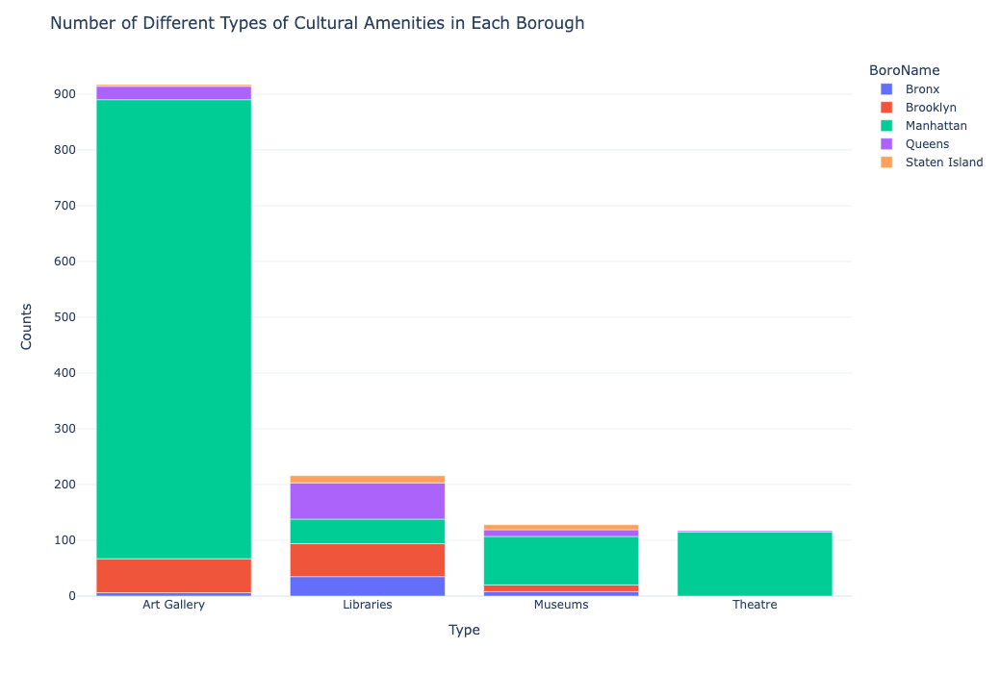

In [13]:
fig = px.bar(amenities_boro, x='Type', y='Counts', color='BoroName')
fig.update_layout(template='plotly_white', height=700, title='Number of Different Types of Cultural Amenities in Each Borough')
fig.show()

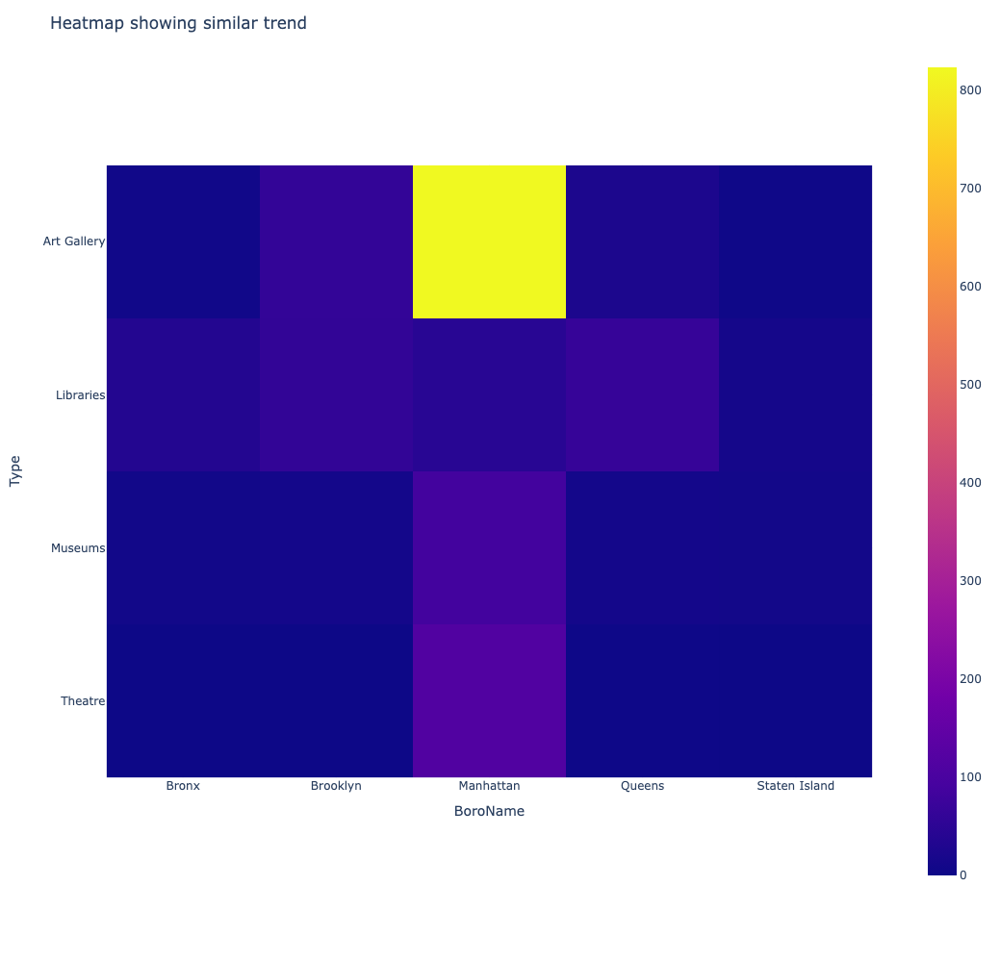

In [14]:
amenities_boro_heatmap = amenities_boro.pivot(index=['Type'], columns='BoroName', values='Counts').fillna(0)

fig = px.imshow(amenities_boro_heatmap)
fig.update_layout(template='plotly_white', height=1000, width=1000, title='Heatmap showing similar trend')

fig.show()

## 1.2 Distributions Across Neighborhoods

If we treat all types of amenities as a whole and look at their spatial distribution across neighborhoods, we get the map below. The map is normalized by population of each neighborhood (2020 Census), while the bar chart shows the absolute counts of amenities. 

Together, they show similar trend of Manhattan being the predominant hub for arts and cultural activities, in particular, SoHo, Chealsea, Midtown-Time Sq., Midtown-South-Flatiron-Union Sq., and Upper East-Carnegie Hall are homes to significantly more cultural amenities. This matches the public perception of those neighborhoods being more ‘artsy’ and are usually popular tourists’ destinations. 


In [15]:
NYC_NTA = NYC_Neighborhood[['NTAName', 'geometry']]
amenities_NTA = amenities_geo.groupby(['NTAName']).size().reset_index()
amenities_NTA = amenities_NTA.rename(columns={amenities_NTA.columns[1]: 'Counts'})

amenities_NTA = NYC_NTA.merge(
    amenities_NTA, on='NTAName'
)
amenities_NTA_pop = amenities_NTA.merge(NYC_NTA_pop, on='NTAName')
amenities_NTA_pop['Normalized'] = amenities_NTA_pop.apply(
    lambda row: row['Counts'] / row['estimate'] if (row['estimate'] != 0 and row['estimate'] > 100) else 0, axis=1
)



In [16]:
amenities_NTA_pop.explore(column='Normalized', tiles="cartodbpositron")

In [17]:
amenities_NTA_types = amenities_geo.groupby(['Type', 'NTAName']).size().reset_index()
amenities_NTA_types = amenities_NTA_types.rename(columns={amenities_NTA_types.columns[2]: 'Counts'})
amenities_NTA_types = amenities_NTA_types.merge(NYC_NTA, on='NTAName').drop(columns='geometry')


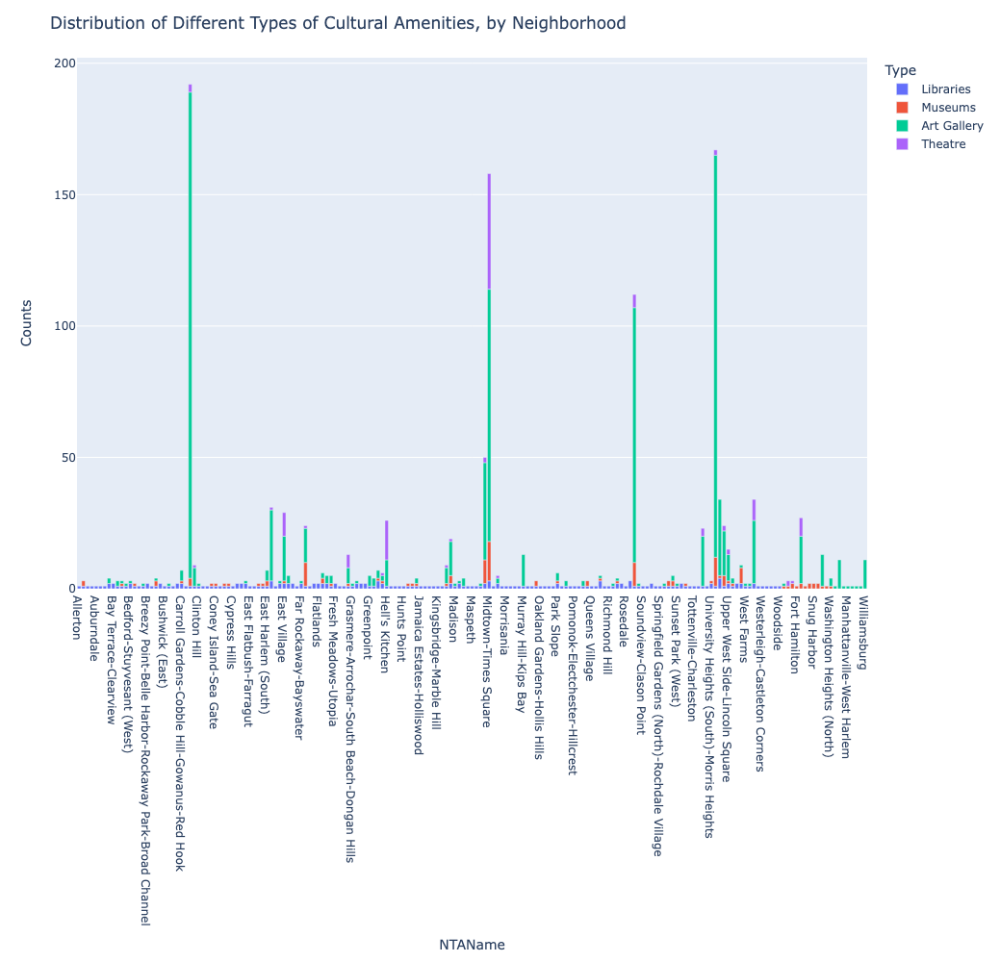

In [18]:


fig = px.bar(amenities_NTA_types.sort_values(by='NTAName'), x='NTAName', y='Counts', color='Type')
fig.update_layout(height=1000, title='Distribution of Different Types of Cultural Amenities, by Neighborhood')
fig.show()

## 1.3 Cultural Amenities x Income 

Utilizing census data of median household income, I plotted the income vs. number of arts and cultural amenities relationship in the following scatter plot. Aligning with trends identified in the previous two sections, neighborhoods in Manhattan host more cultural amenities, and they tend to be home to people that are more well-off. Interestingly, for Bronx, Brooklyn, Queens, and Staten Island, we are seeing a relatively low number of amenities irrespective of the median household income. This suggests that income is not the only factor and should not be the restraint for development of art and cultural amenities. Communities with lower incomes have hope and should deserve more arts and cultural amenities in their close proximity, too. 

In [19]:
# NYC Population

NYC_income = gpd.read_file("./Final_Data/1/NYC_Income.geojson")
NYC_income = NYC_income[['GEOID', 'estimate']]
NYC_income['GEOID']=NYC_income['GEOID'].astype(int)

NYC_income = NYC_Tracts.merge(NYC_income, on='GEOID', how='left') 
NYC_NTA_income = NYC_income.groupby(['NTAName']).median(['estimate']).reset_index().fillna(0)

In [20]:
NTA_Boro_Name = NYC_Neighborhood[['NTAName', 'BoroName']]

In [21]:
amenities_NTA_income = amenities_NTA.merge(NYC_NTA_income, on='NTAName')
amenities_NTA_income = amenities_NTA_income.merge(NTA_Boro_Name, on='NTAName')

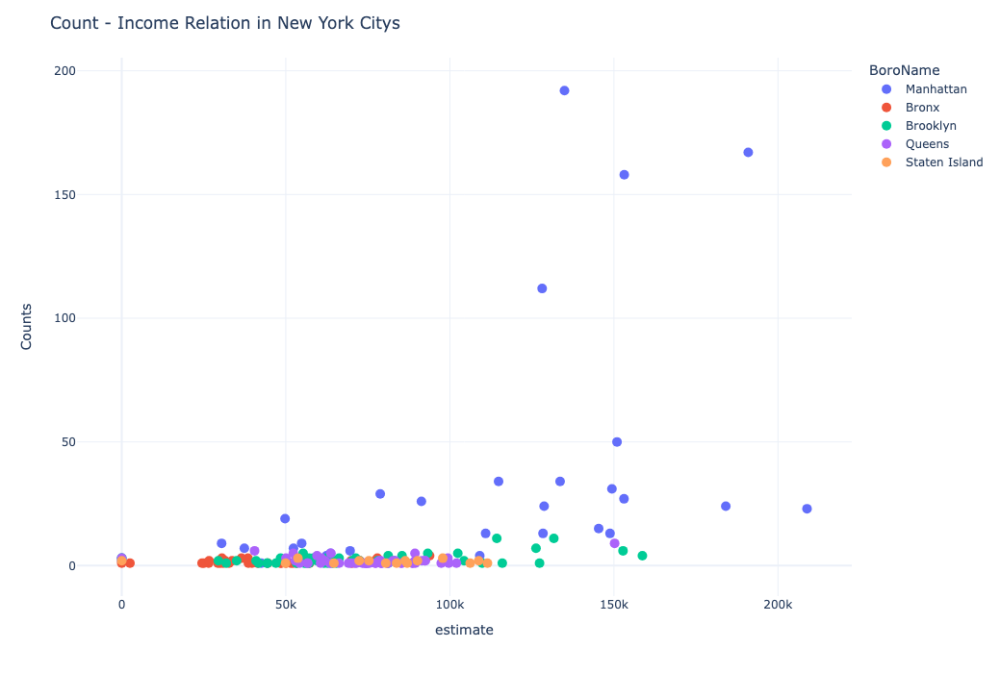

In [22]:
fig = px.scatter(amenities_NTA_income, x='estimate', y='Counts', color='BoroName')
fig.update_traces(marker_size=10)
fig.update_layout(height=700, template='plotly_white', title="Count - Income Relation in New York Citys")
fig.show()

# 2. London

## 2.1 Creative Enterprise Zone

To start off my digital exploration of Greater London, I mapped the Creative Enterprise Zones (CEZ), which was launched in 2018. According to Mayor’s office, CEZ is a Mayoral initiative “to designate areas of London where artists and creative businesses can find permanent affordable space to work; are supported to start-up and grow, and where local people are helped to learn creative sector skills and access pathways to employment.” [1] As plotted on map, CEZ is distributed across the city. Though still growing, this initiative can be a potential successful prototype for many other cities to deploy to support local art and businesses. (Feels like the Business Improvement District of arts…)

[1] https://www.london.gov.uk/programmes-strategies/arts-and-culture/space-culture/explore-creative-enterprise-zones/about-creative-enterprise-zones


In [23]:
London_CEZ.explore(column='sitename', tiles="cartodbpositron")

## 2.2 Spatial Distribution of Amenities in London

As expected, CEZ seems to be filling the spatial gaps between existing hubs of art and cultural activities in the city center. One important characteristic is that Greater London Authority has a very complete dataset of ALL types of cultural infrastructure, not only including performing or exhibiting spaces, but also creative spaces (e.g., studios or creative coworking space) and rehearsal space for performing arts. In comparison, NYC’s Open Data portal only highlights the more prominent types, which are particularly helpful for visitors. London’s dataset also incorporates creative workers, producers, and artists, which are fundamental for offering support and evaluating the effectiveness of their policies like CEZ. Again, spatial data collection becomes the very first important step for laying foundation for further analysis, enforcements, or incentives. 

Similar to NYC, London’s city center is home to a lot more cultural amenities, especially Westminster and Camden. Yet despite the disparities, the boroughs on the outskirts have a decent number of amenities, ranging from 20 to 82, which can be considered relatively satisfactory. 


In [24]:
London_amenities.explore(column='Type', tiles='Carto DB Positron')

In [25]:
London_Boro_Counts = pd.DataFrame(London_amenities.groupby(['Borough']).size()).reset_index()
London_Boro_Counts = London_Boro_Counts.rename(columns={London_Boro_Counts.columns[1]: 'Counts'})

In [26]:
London_Boro = London_Boro.rename(columns={London_Boro.columns[1]: 'Borough'})

In [27]:
London_Boro_Counts = London_Boro.merge(London_Boro_Counts, on='Borough')
London_Boro_Counts.explore(
    column='Counts', tiles='Carto DB Positron')

## 2.3 Income by Borough

The income data of boroughs of London is represented in hourly wage. The historic data has shown an increase in median hourly wage for all boroughs, though there has been a prominent difference in income across all boroughs. It can be spatially represented in the map below.



In [28]:
Earnings = pd.read_csv('./Final_Data/1/London_Earnings_Simplified.csv')

In [29]:
Earnings_geo = London_Boro.merge(Earnings, on='Borough')

In [30]:
Earnings_Long = pd.melt(Earnings, id_vars=['Borough'], var_name='Year', value_name='Hourly Pay')

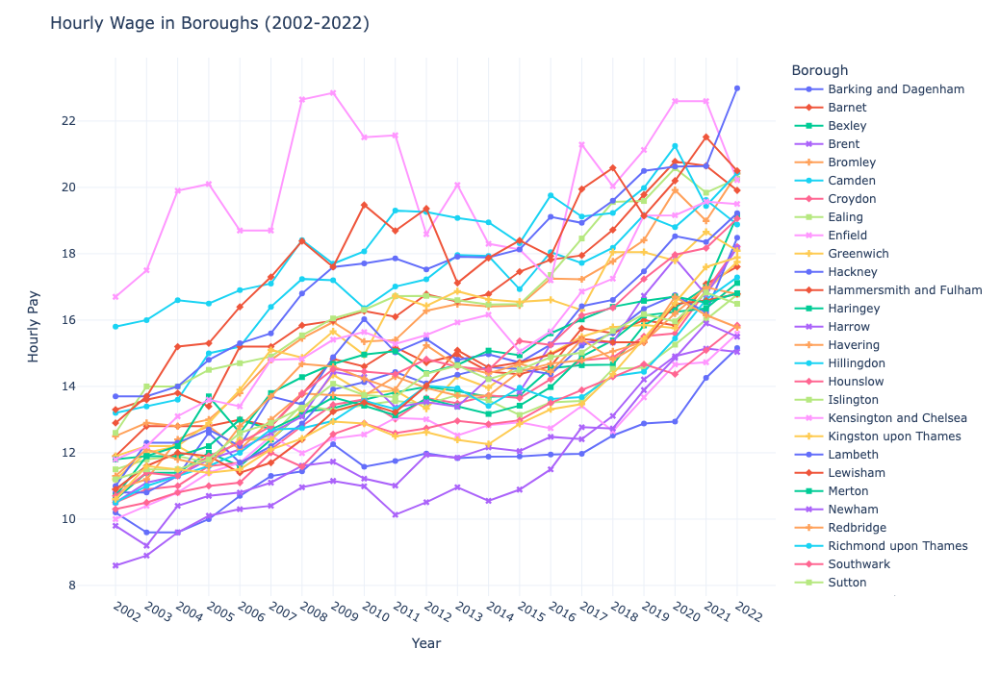

In [31]:
fig = px.line(Earnings_Long, x='Year', y='Hourly Pay', color='Borough', symbol="Borough")

fig.update_layout(title_text="Hourly Wage in Boroughs (2002-2022)", 
                  height=700,
                 template='plotly_white')
fig.show()

In [33]:
Earnings_2022 = Earnings_Long.loc[Earnings_Long['Year'] == '2022']
Earnings_Amenities = Earnings_2022.merge(London_Boro_Counts, on='Borough')
Earnings_Amenities_Geo =  London_Boro_Counts.merge(Earnings_2022, on='Borough')

In [34]:
Earnings_Amenities_Geo.explore(
     column="Hourly Pay",
     tiles="Carto DB Positron")

## 2.4 Income and Access to Cultural Infrastructure

Similar to NYC, there seems to be a weak correlation between income and number of cultural amenities, and most boroughs have a decent number of amenities, despite the gap with the top one, Westminster. 

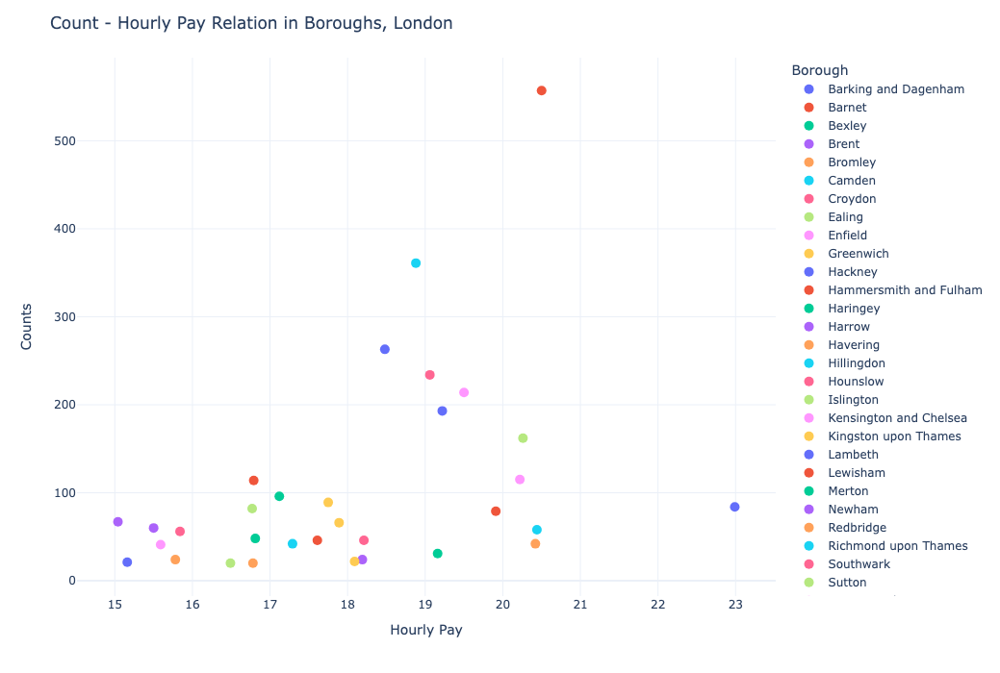

In [35]:
fig = px.scatter(Earnings_Amenities, y="Counts", x="Hourly Pay", color="Borough")
fig.update_traces(marker_size=10)
fig.update_layout(height=700, template='plotly_white', title="Count - Hourly Pay Relation in Boroughs, London")
fig.show()

# 3. Comparison


## 3.1 Type of Cultural Infrastructure Comparison

Though this section is meant to provide comparisons between the two cities, it is important to acknowledge that the two cities are incomparable in many ways, from demographics to history to cultural roots. As this bar plot encapsulates, the existing data is largely different for two cities, with London having sophisticated data collection and more detailed breakdown. In London’s data, galleries are broken down into public and private commercial ones – while public galleries and museums are aggregated into the same category, commercial galleries stand alone in their own characteristic. Looking at data for NYC’s galleries, we see that it is a generic category of all galleries. Fundamentally, NYC’s data seems to be visitor oriented as visitors wouldn’t mind much about profiles of art galleries but rather what’s being displayed, versus London’s portal is set up more for city’s governing bodies, where public vs. private profiles largely impacts their income and tax status, funding, and many other aspects.

In [36]:
London_Counts = pd.DataFrame(London_amenities.groupby(['Type']).size()).reset_index()
London_Counts = London_Counts.rename(columns={London_Counts.columns[1]: 'Counts'})
NYC_Counts = pd.DataFrame(NYC_amenities.groupby(['Type']).size()).reset_index()
NYC_Counts = NYC_Counts.rename(columns={NYC_Counts.columns[1]: 'Counts'})

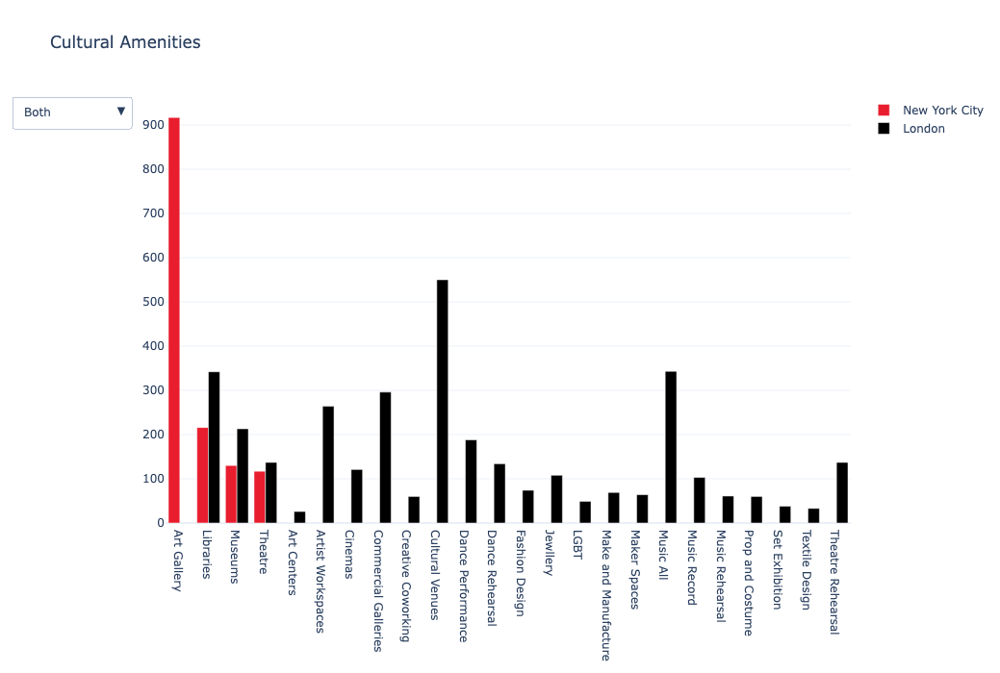

In [37]:
fig = go.Figure()


fig.add_trace(
    go.Bar(x=NYC_Counts['Type'], 
           y=NYC_Counts['Counts'], 
           name='New York City',
          marker=dict(color="#E81D2E")))


fig.add_trace(
    go.Bar(x=London_Counts['Type'], 
           y=London_Counts['Counts'], 
           name='London',
          marker=dict(color="Black")))

#add dropdown

fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="Both",
                    method="update",
                    args=[{"visible": [True, True]},
                        {"title": "Both",
                         "annotations": []}]),
                dict(label="New York City",
                    method="update",
                    args=[{"visible": [True, False]},
                        {"title": "New York City",
                         "annotations": []}]),
                dict(label="London",
                    method="update",
                    args=[{"visible": [False, True]},
                        {"title": "London",
                         "annotations": []}])
            ]))])

fig.update_layout(title_text="Cultural Amenities", 
                  height=700,
                 template='plotly_white')
fig.show()


## 3.2 Two Cities Comparison: A Glance

Additionally, considering the big difference of size (areal size) and socio-economic status, and minor difference in population, it is only fair to look at total number of arts and cultural amenities after being normalized by population, area, or income. The normalized data for comparison is showcased in the following bar plot with a dropdown menu. 

In [47]:
London_Counts_short = London_Counts[London_Counts['Type'].isin(['Art Centers', 'Commercial Galleries', 'Museums', 'Theatre', 'Libraries'])]

In [48]:
NYC_London_Compare = pd.DataFrame([['NYC', NYC_Counts['Counts'].sum()], ['London', London_Counts_short['Counts'].sum()]], columns=['City', 'Total Counts'])
NYC_London_Compare['by Population (Per 1000 People)'] = NYC_London_Compare.apply(lambda row: row['Total Counts'] / 8335.897 if row['City'] == 'NYC' else row['Total Counts'] / 8796.628, axis=1)
NYC_London_Compare['by Area/Size (Per Sq Miles)'] = NYC_London_Compare.apply(lambda row: row['Total Counts'] / 302.6 if row['City'] == 'NYC' else row['Total Counts'] / 607, axis=1)
NYC_London_Compare['by Household Income ($)'] = NYC_London_Compare.apply(lambda row: row['Total Counts'] / 76607 if row['City'] == 'NYC' else row['Total Counts'] / 40642.44, axis=1)


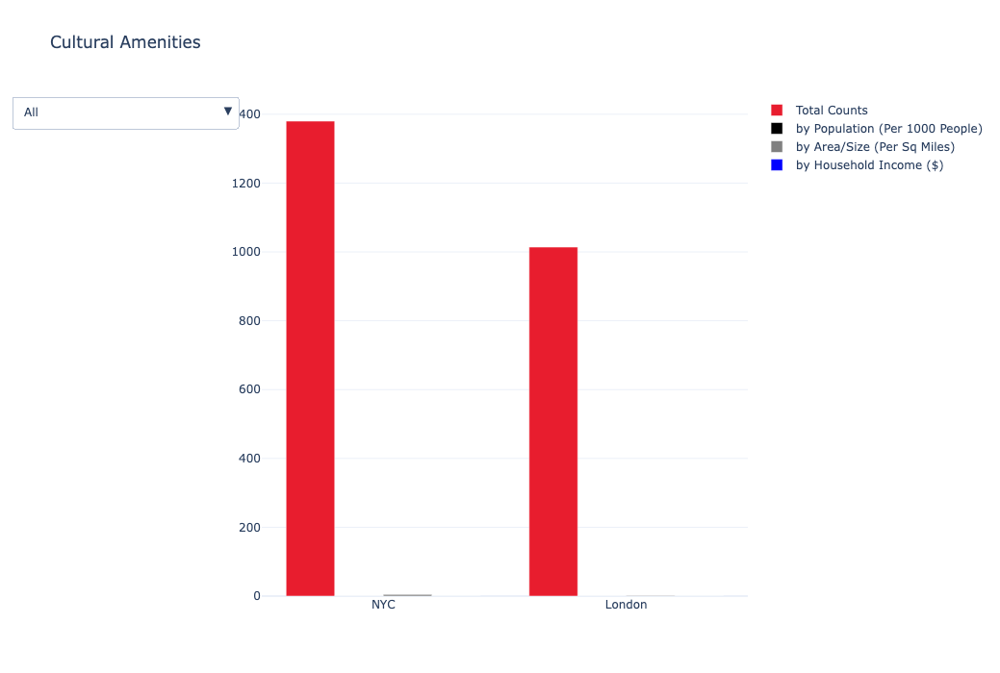

In [49]:
fig = go.Figure()

fig.add_trace(
    go.Bar(x=NYC_London_Compare['City'],
           y=NYC_London_Compare['Total Counts'],
           name='Total Counts',
          marker=dict(color="#E81D2E")))

fig.add_trace(
    go.Bar(x=NYC_London_Compare['City'], 
           y=NYC_London_Compare['by Population (Per 1000 People)'], 
           name='by Population (Per 1000 People)',
          marker=dict(color="Black")))
    
fig.add_trace(
    go.Bar(x=NYC_London_Compare['City'], 
           y=NYC_London_Compare['by Area/Size (Per Sq Miles)'], 
           name='by Area/Size (Per Sq Miles)',
          marker=dict(color="Grey")))

fig.add_trace(
    go.Bar(x=NYC_London_Compare['City'], 
           y=NYC_London_Compare['by Household Income ($)'], 
           name='by Household Income ($)',
          marker=dict(color="Blue")))

#add dropdown

fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="All",
                    method="update",
                    args=[{"visible": [True, True, True, True]},
                        {"title": "All",
                         "annotations": []}]),
                dict(label="Total Counts",
                    method="update",
                    args=[{"visible": [True, False, False, False]},
                        {"title": "Number of Cultural Amenities",
                         "annotations": []}]),
                dict(label="by Population (Per 1000 People)",
                    method="update",
                    args=[{"visible": [False, True, False, False]},
                        {"title": "Number of Cultural Amenities by Population (Per 1000 People)",
                         "annotations": []}]),
                dict(label="by Area/Size (Per Sq Miles)",
                    method="update",
                    args=[{"visible": [False, False, True, False]},
                        {"title": "Number of Cultural Amenities by Area/Size (Per Sq Miles)",
                         "annotations": []}]),
                dict(label="by Household Income ($)",
                    method="update",
                    args=[{"visible": [False, False, False, True]},
                        {"title": "Number of Cultural Amenities by Household Income ($)",
                         "annotations": []}])
                
            ]))])

fig.update_layout(title="Cultural Amenities ", 
                  height=700,
                 template='plotly_white')
fig.show()
